In [ ]:
from utils.enhancement import enhance_full_image
from utils.slicing import slice_grid
from utils.visualization import show_before_after

import cv2
import os
import matplotlib.pyplot as plt


applying smoothing


In [ ]:
import os
import cv2
from utils.enhancement import enhance_full_image   # your pipeline
from utils.visualization import show_before_after   # your comparison function

# ----------------------------
# Paths
# ----------------------------
input_root = "../data/"
output_root = "../phase1/results/enhanced_images/"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

# create main output folder
os.makedirs(output_root, exist_ok=True)

# how many previews per folder
samples_per_folder = 5


# ----------------------------
# PROCESS ALL IMAGES
# ----------------------------
for folder_name, grid in folders.items():

    print(f"\n🔹 Processing folder: {folder_name}")

    input_path = os.path.join(input_root, folder_name)
    output_path = os.path.join(output_root, folder_name)

    # create output folder for this puzzle size
    os.makedirs(output_path, exist_ok=True)

    # list all images
    images = [
        f for f in os.listdir(input_path)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ]

    preview_count = 0

    for filename in images:
        img_path = os.path.join(input_path, filename)
        img = cv2.imread(img_path)

        # run enhancement
        enhanced = enhance_full_image(img)["final"]

        # save enhanced image
        save_path = os.path.join(output_path, filename)
        cv2.imwrite(save_path, enhanced)

        print(f"✔ Saved enhanced image → {save_path}")

        # preview first 5 images only
        if preview_count < samples_per_folder:
            show_before_after(
                img,
                enhanced,
                title1="Original",
                title2="Enhanced"
            )
            preview_count += 1


slicing the images


In [8]:
import os
import cv2

input_root = "./results/enhanced_images"          # folder that already contains puzzle_2x2, puzzle_4x4, puzzle_8x8
output_root = "../phase1/results/enhanced_images_sliced"  # where to save sliced pieces

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

os.makedirs(output_root, exist_ok=True)

def slice_grid(image_path, save_dir, grid):
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Cannot read image: {image_path}")
    h, w = img.shape[:2]
    base_h = h // grid
    base_w = w // grid
    index = 0
    for row in range(grid):
        y1 = row * base_h
        y2 = (row + 1) * base_h if row < grid - 1 else h
        for col in range(grid):
            x1 = col * base_w
            x2 = (col + 1) * base_w if col < grid - 1 else w
            piece = img[y1:y2, x1:x2]
            os.makedirs(save_dir, exist_ok=True)
            piece_path = os.path.join(save_dir, f"piece_{index:03d}.png")
            cv2.imwrite(piece_path, piece)
            index += 1
    return index

for folder, grid in folders.items():
    in_path = os.path.join(input_root, folder)
    if not os.path.isdir(in_path):
        print(f"Skipping (not found): {in_path}")
        continue
    out_folder = os.path.join(output_root, folder)
    os.makedirs(out_folder, exist_ok=True)
    images = sorted([f for f in os.listdir(in_path) if f.lower().endswith((".png", ".jpg", ".jpeg"))])
    for filename in images:
        src = os.path.join(in_path, filename)
        name = os.path.splitext(filename)[0]
        dest_dir = os.path.join(out_folder, name)
        try:
            n = slice_grid(src, dest_dir, grid)
            print(f"Sliced {filename} -> {n} pieces saved to {dest_dir}")
        except Exception as e:
            print(f"ERROR slicing {filename}: {e}")

print("Done.")


Sliced 0.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\0
Sliced 1.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\1
Sliced 10.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\10
Sliced 100.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\100
Sliced 101.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\101
Sliced 102.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\102
Sliced 103.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\103
Sliced 104.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\104
Sliced 105.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\105
Sliced 106.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\106
Sliced 107.jpg -> 4 pieces saved to ../phase1/results/enhanced_images_sliced\puzzle_2x2\10

applying edges detection on the sliced images 


In [12]:
import os
import cv2
import numpy as np

from utils.edges import sobel_edges, laplacian_edges, canny_edges

# -----------------------------
# Paths
# -----------------------------
sliced_root = "./results/enhanced_images_sliced"
output_root = "./results/edges_detection_results"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

methods = ["sobel", "laplacian", "canny"]

# -----------------------------
# Create output folder structure
# -----------------------------
for method in methods:
    for puzzle in folders:
        os.makedirs(os.path.join(output_root, method, puzzle), exist_ok=True)


# -----------------------------
# Read ALL SUBFOLDERS + images
# -----------------------------
for puzzle in folders:

    puzzle_path = os.path.join(sliced_root, puzzle)
    print(f"\n🔍 Processing puzzle folder: {puzzle}")

    # Example: puzzle_2x2 → folders 0,1,2,...
    subfolders = sorted([d for d in os.listdir(puzzle_path)
                         if os.path.isdir(os.path.join(puzzle_path, d))])

    if not subfolders:
        print("❌ No subfolders found!")
        continue

    for sub in subfolders:

        sub_in_path = os.path.join(puzzle_path, sub)

        # Create matching output subfolder
        for method in methods:
            os.makedirs(os.path.join(output_root, method, puzzle, sub), exist_ok=True)

        files = sorted([f for f in os.listdir(sub_in_path)
                        if f.lower().endswith((".png", ".jpg", ".jpeg"))])

        print(f"   ➤ Processing subfolder {sub} ({len(files)} pieces)")

        for filename in files:

            img_path = os.path.join(sub_in_path, filename)
            img = cv2.imread(img_path)
            if img is None:
                continue

            # Apply techniques
            sobel_map = sobel_edges(img)
            lap_map = laplacian_edges(img)
            canny_map = canny_edges(img, threshold1=80, threshold2=160)

            # Save in corresponding method folders
            cv2.imwrite(os.path.join(output_root, "sobel", puzzle, sub, filename), sobel_map)
            cv2.imwrite(os.path.join(output_root, "laplacian", puzzle, sub, filename), lap_map)
            cv2.imwrite(os.path.join(output_root, "canny", puzzle, sub, filename), canny_map)

print("\n✅ DONE! All sliced pieces processed.")



🔍 Processing puzzle folder: puzzle_2x2
   ➤ Processing subfolder 0 (4 pieces)
   ➤ Processing subfolder 1 (4 pieces)
   ➤ Processing subfolder 10 (4 pieces)
   ➤ Processing subfolder 100 (4 pieces)
   ➤ Processing subfolder 101 (4 pieces)
   ➤ Processing subfolder 102 (4 pieces)
   ➤ Processing subfolder 103 (4 pieces)
   ➤ Processing subfolder 104 (4 pieces)
   ➤ Processing subfolder 105 (4 pieces)
   ➤ Processing subfolder 106 (4 pieces)
   ➤ Processing subfolder 107 (4 pieces)
   ➤ Processing subfolder 108 (4 pieces)
   ➤ Processing subfolder 109 (4 pieces)
   ➤ Processing subfolder 11 (4 pieces)
   ➤ Processing subfolder 12 (4 pieces)
   ➤ Processing subfolder 13 (4 pieces)
   ➤ Processing subfolder 14 (4 pieces)
   ➤ Processing subfolder 15 (4 pieces)
   ➤ Processing subfolder 16 (4 pieces)
   ➤ Processing subfolder 17 (4 pieces)
   ➤ Processing subfolder 18 (4 pieces)
   ➤ Processing subfolder 19 (4 pieces)
   ➤ Processing subfolder 2 (4 pieces)
   ➤ Processing subfolder 20 (4 p


Folder: puzzle_2x2 (110 images)


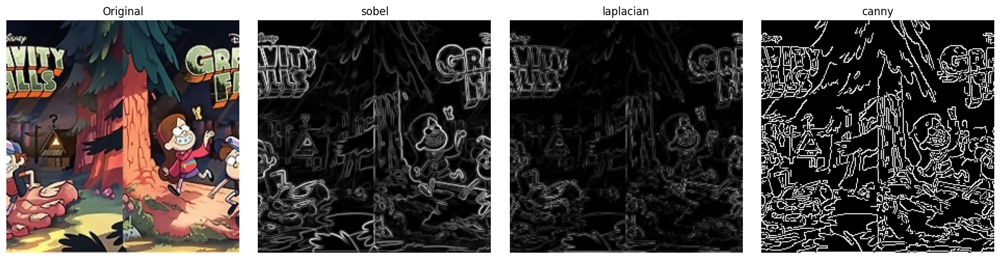

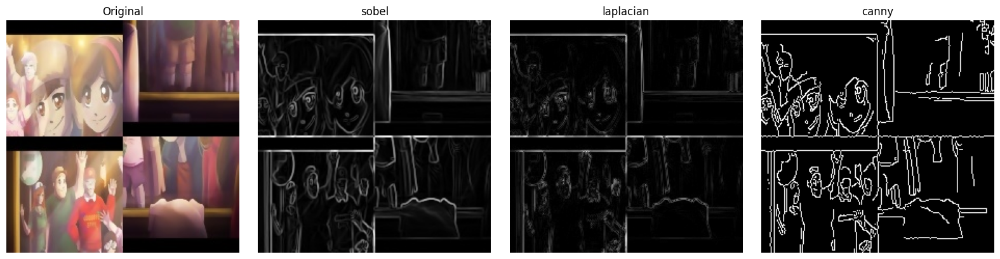

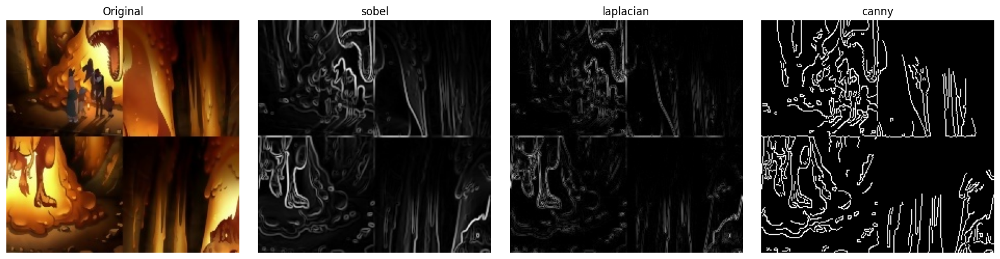

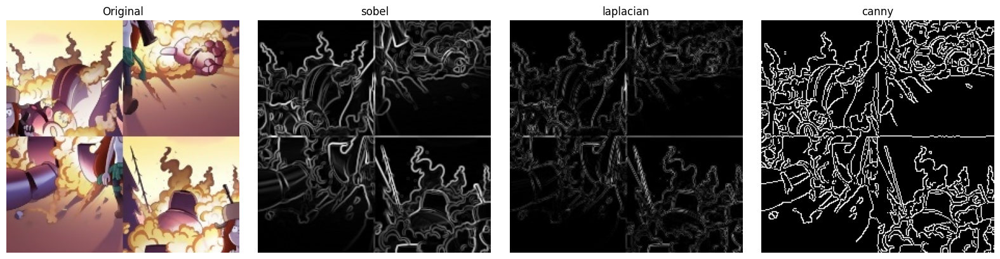

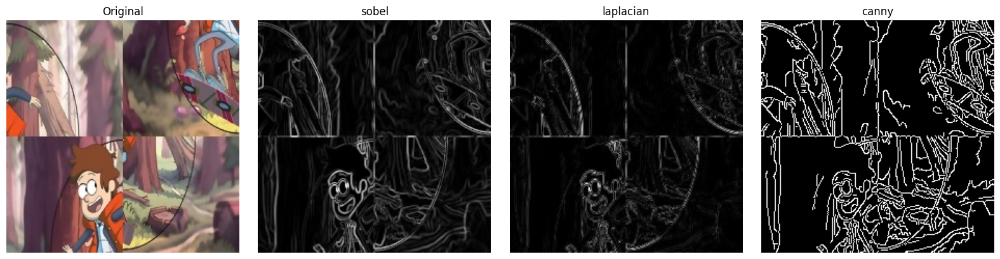

previewed 5 images from puzzle_2x2

Folder: puzzle_4x4 (110 images)


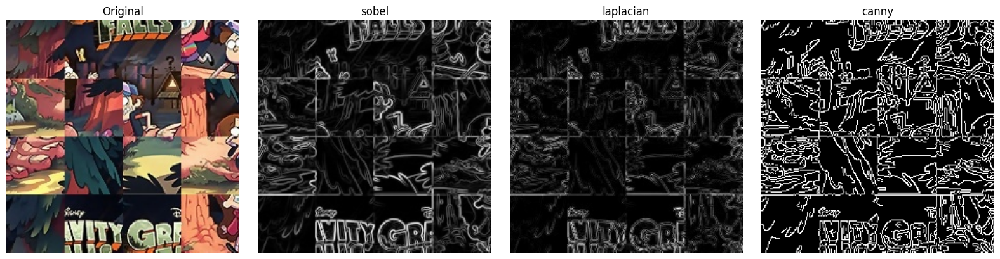

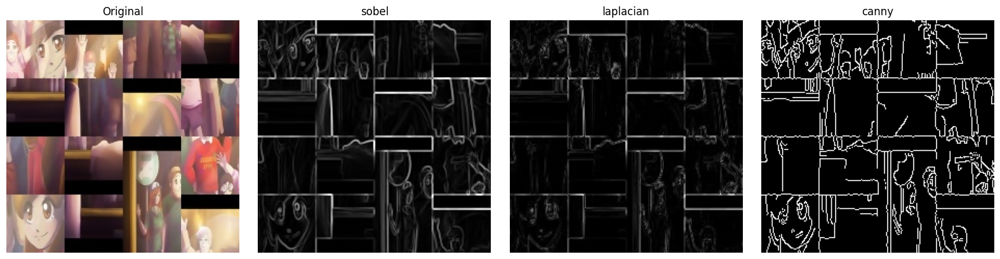

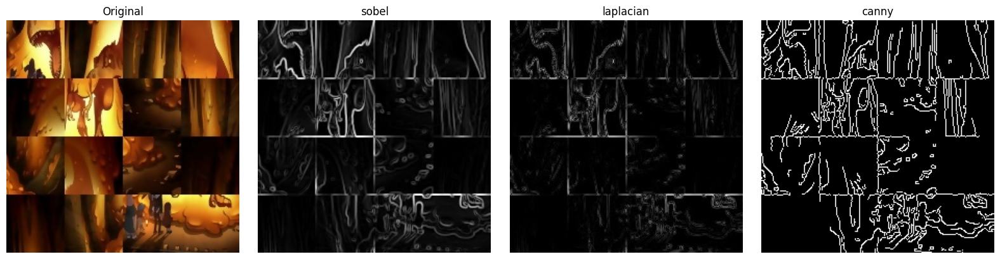

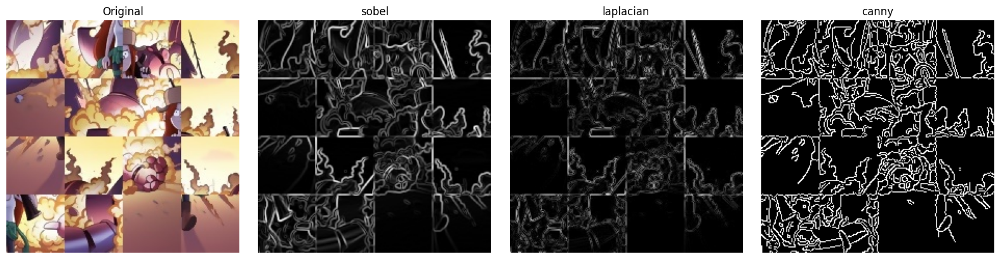

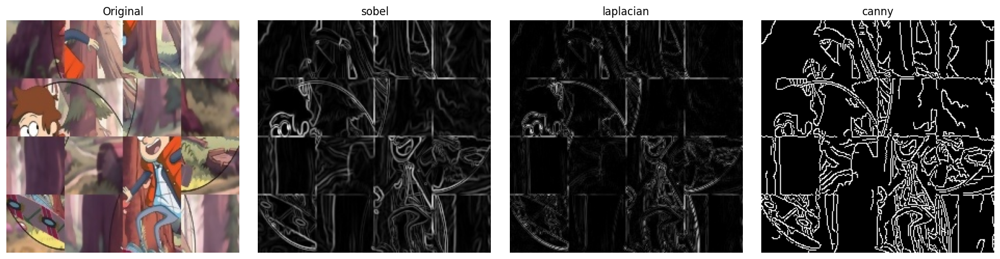

previewed 5 images from puzzle_4x4

Folder: puzzle_8x8 (110 images)


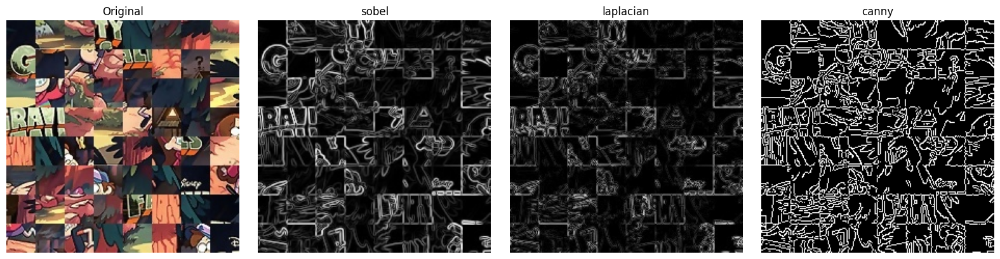

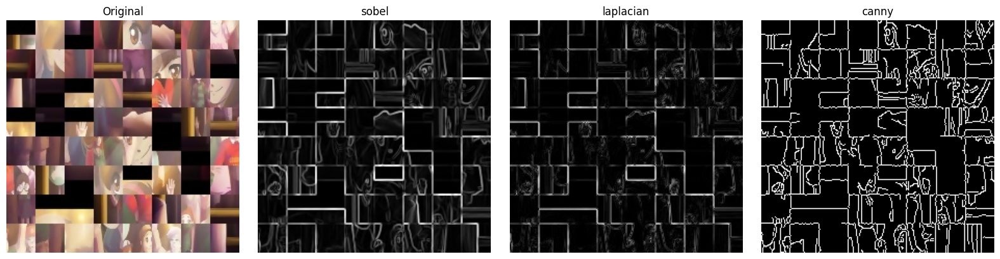

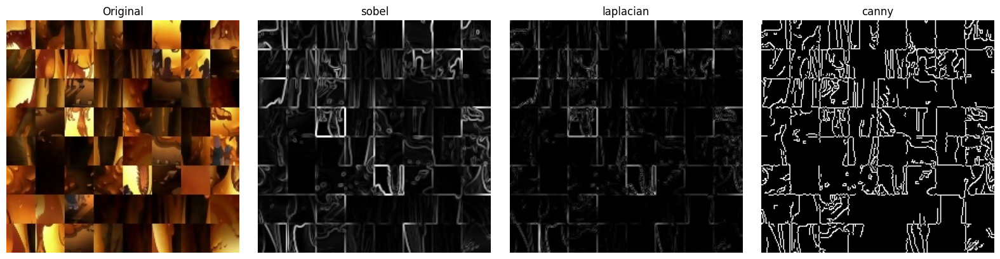

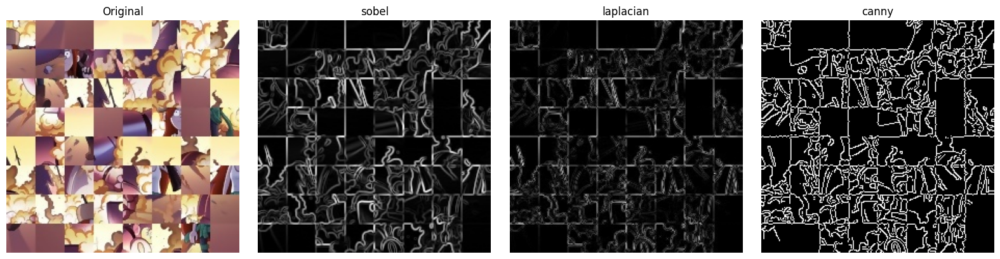

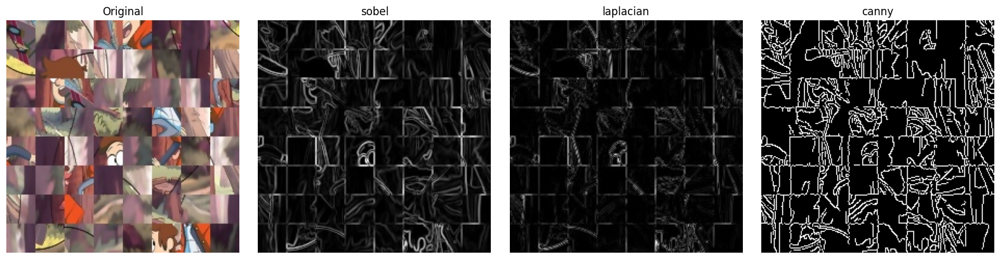

previewed 5 images from puzzle_8x8
done


In [7]:
from utils.edges import process_folders_edges

input_root = "./results/enhanced_images"
folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

# quick preview 5 samples per folder, don't save files yet
process_folders_edges(
    input_root=input_root,
    folders=folders,
    output_root=None,          # don't save now
    methods=("sobel","laplacian","canny"),
    samples_per_folder=5,
    save_maps=False,
    canny_params={"threshold1":80,"threshold2":180,"apertureSize":3,"L2gradient":False},
    sobel_ksize=3,
    lap_ksize=3
)


In [8]:
 
#     "puzzle_2x2": 2,
#     "puzzle_4x4": 4,
#     "puzzle_8x8": 8
# }

# os.makedirs(enhanced_root, exist_ok=True)

# # Counter for visualization (you want to SHOW only 10, but SAVE ALL)
# visualize_limit = 10
# visualize_count = 0

# for folder, grid in folders.items():
#     print(f"\nProcessing folder: {folder}")

#     in_path = os.path.join(input_root, folder)
#     out_path = os.path.join(enhanced_root, folder)
#     os.makedirs(out_path, exist_ok=True)

#     images = [
#         f for f in os.listdir(in_path)
#         if f.lower().endswith((".png", ".jpg", ".jpeg"))
#     ]

#     for filename in images:
#         img_path = os.path.join(in_path, filename)
#         img = cv2.imread(img_path)

#         # run enhancement pipeline (your updated one)
#         outputs = enhance_full_image(img)
#         enhanced_img = outputs["final"]

#         # save enhanced full image
#         save_path = os.path.join(out_path, filename)
#         cv2.imwrite(save_path, enhanced_img)
#         print(f"Enhanced → {save_path}")

#         # only show first 10 examples (NOT save only 10)
#         if visualize_count < visualize_limit:
#             show_before_after(img, enhanced_img,
#                               title1="Original",
#                               title2="Enhanced")
#             visualize_count += 1



input_root = "../data/"

folders = {
    "puzzle_2x2": 2,
    "puzzle_4x4": 4,
    "puzzle_8x8": 8
}

# Show 5 samples PER FOLDER
samples_per_folder = 5

for folder, grid in folders.items():
    print(f"\nProcessing folder: {folder}")

    in_path = os.path.join(input_root, folder)

    # get all images
    images = [
        f for f in os.listdir(in_path)
        if f.lower().endswith((".png", ".jpg", ".jpeg"))
    ]

    preview_count = 0  # reset counter **for each folder**

    for filename in images:
        img_path = os.path.join(in_path, filename)
        img = cv2.imread(img_path)

        # run your enhancement pipeline
        outputs = enhance_full_image(img)
        enhanced_img = outputs["final"]

        print(f"Preview → {filename}")

        # show only first 5 enhanced samples **from this folder**
        if preview_count < samples_per_folder:
            show_before_after(
                img,
                enhanced_img,
                title1="Original",
                title2="Enhanced"
            )
            preview_count += 1

        # stop previewing this folder
        if preview_count >= samples_per_folder:
            break






Processing folder: puzzle_2x2


NameError: name 'enhance_full_image' is not defined

In [ ]:
# sliced_root = "../phase1/results/"

# for folder, grid in folders.items():
#     print(f"Slicing enhanced images: {folder}")

#     in_path = os.path.join(enhanced_root, folder)
#     out_path = os.path.join(sliced_root, folder)
#     os.makedirs(out_path, exist_ok=True)

#     for filename in os.listdir(in_path):
#         if not filename.lower().endswith((".png", ".jpg")):
#             continue

#         img_path = os.path.join(in_path, filename)
#         img = cv2.imread(img_path)

#         img_save_dir = os.path.join(out_path, filename.split(".")[0])
#         os.makedirs(img_save_dir, exist_ok=True)

#         num_saved = slice_grid(img, img_save_dir, grid)
#         print(f"Sliced {filename} → {num_saved} pieces")


In [ ]:



# root_data = "../data/"                # where puzzle_2x2, puzzle_4x4, puzzle_8x8 live
# output_root = "../phase1/results/"   # where sliced pieces will be saved


# puzzle_folders = {
#     "puzzle_2x2": 2,
#     "puzzle_4x4": 4,
#     "puzzle_8x8": 8
# }

# # Ensure output root exists
# os.makedirs(output_root, exist_ok=True)


 
# #   slice any image into grid_size x grid_size pieces
 
# def slice_grid(image_path, save_dir, grid_size):

#     img = cv2.imread(image_path)
#     if img is None:
#         raise ValueError(f"Failed to read image: {image_path}")

#     h, w = img.shape[:2]


#     # Compute base piece size (floor division). We'll handle remainder on the last row/column.
#     base_piece_h = h // grid_size
#     base_piece_w = w // grid_size

#     os.makedirs(save_dir, exist_ok=True)

#     index = 0                                                
#     for row in range(grid_size):
#         # y start
#         y1 = row * base_piece_h
#         # y end: for last row, use full image height to include any remainder
#         y2 = (row + 1) * base_piece_h if row < grid_size - 1 else h

#         for col in range(grid_size):
#             x1 = col * base_piece_w
#             x2 = (col + 1) * base_piece_w if col < grid_size - 1 else w

#             # crop the tile
#             piece = img[y1:y2, x1:x2]

#             # save tile with zero-padded index
#             piece_filename = f"piece_{index:03d}.png"
#             piece_path = os.path.join(save_dir, piece_filename)
#             cv2.imwrite(piece_path, piece)

#             index += 1

#     return index



# # Main processing loop: go over each configured puzzle folder

# for folder_name, grid in puzzle_folders.items():
#     input_folder = os.path.join(root_data, folder_name)
#     output_folder = os.path.join(output_root, folder_name)

#     # skip if the input folder doesn't exist
#     if not os.path.exists(input_folder):
#         print(f"Skipping '{folder_name}': input folder not found at {input_folder}")
#         continue

#     # ensure output folder exists
#     os.makedirs(output_folder, exist_ok=True)

#     print(f"\nProcessing folder: {folder_name}  (Grid: {grid}x{grid})")

#     # iterate all image files in the input folder
#     for filename in sorted(os.listdir(input_folder)):
#         if not filename.lower().endswith((".png", ".jpg", ".jpeg")):
#             continue

#         img_path = os.path.join(input_folder, filename)
#         # folder to save pieces for this image, named by the base image file (without extension)
#         img_name = os.path.splitext(filename)[0]
#         img_output_dir = os.path.join(output_folder, img_name)
#         os.makedirs(img_output_dir, exist_ok=True)

#         print(f"  - Slicing '{filename}' ...", end=" ")
#         try:
#             num_saved = slice_grid(img_path, img_output_dir, grid)
#             print(f"done ({num_saved} pieces saved).")
#         except Exception as e:
#             print(f"ERROR: {e}")

# print("\nAll done — check the output folders under:", output_root)
